In [213]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style(style="whitegrid")
import cv2
import os
import glob as gb
from skimage.transform import resize
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

In [10]:
train_path = "/kaggle/input/tomatoleaf/tomato/train"
test_path = "/kaggle/input/tomatoleaf/tomato/val"

In [191]:
def num_class(path , name):
    c = 0
    for folder in os.listdir(path):
        files = gb.glob(pathname=str(train_path + "/" +folder + "/*"))
        print(f"we found {len(files)} in {folder} for {name}")
        print("=-" * 20)
        c+=1
    print(f"the number of class = {c}")

In [192]:
num_class(train_path , "train")

we found 1000 in Tomato___Late_blight for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___healthy for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Early_blight for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Septoria_leaf_spot for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Tomato_Yellow_Leaf_Curl_Virus for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Bacterial_spot for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Target_Spot for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Tomato_mosaic_virus for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Leaf_Mold for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Spider_mites Two-spotted_spider_mite for train
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
the number of class = 10


In [193]:
num_class(test_path , "test")

we found 1000 in Tomato___Late_blight for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___healthy for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Early_blight for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Septoria_leaf_spot for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Tomato_Yellow_Leaf_Curl_Virus for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Bacterial_spot for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Target_Spot for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Tomato_mosaic_virus for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Leaf_Mold for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
we found 1000 in Tomato___Spider_mites Two-spotted_spider_mite for test
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
the number of class = 10


In [15]:
Code = {"Tomato___Late_blight" : 0 , "Tomato___healthy" : 1 ,
        "Tomato___Early_blight" : 2 , "Tomato___Septoria_leaf_spot":3 , 
       "Tomato___Tomato_Yellow_Leaf_Curl_Virus":4 , "Tomato___Bacterial_spot":5 , 
       "Tomato___Target_Spot":6 ,"Tomato___Tomato_mosaic_virus":7 ,"Tomato___Leaf_Mold":8 ,
       "Tomato___Spider_mites Two-spotted_spider_mite":9}

def get_code(code):
    for i , n in Code.items():
        if code == n :
            return i

In [194]:
def size_data(path):
    size = []
    for folder in os.listdir(path):
        files = gb.glob(pathname=str(path + "/" + folder + "/*"))
        for file in files :
            fil_read = plt.imread(file)
            size.append(fil_read.shape)

    return pd.Series(size).value_counts()

In [195]:
size_data(train_path)

(256, 256, 3)    10000
dtype: int64

In [196]:
size_data(test_path)

(256, 256, 3)    1000
dtype: int64

In [218]:
Y_train = []
Y_test = []

In [220]:
def resize_image(path , name):
    globals()[name] = []
    for folder in os.listdir(path):
            files = gb.glob(pathname=str(path + "/" + folder + "/*"))
            for file in files :
                fil_read = plt.imread(file)

                if fil_read.shape != (100 , 100 , 3):
                    im_resize = resize(fil_read , (80 , 80 , 3))
                    globals()[name].append(im_resize)
                    
                if name == "train":
                    Y_train.append(Code[folder])
                elif name == "test":
                    Y_test.append(Code[folder])
                else:
                    print("not avalid name")
                    
            plt.figure(figsize=(20 , 20))        
            plt.subplot(1 ,3  , 1)
            plt.imshow(fil_read)
            plt.title("befor resize")
            plt.axis("off")

            plt.subplot(1 , 3 , 2)
            plt.imshow(im_resize)
            plt.title("after reszie")
            plt.axis("off")
            
            plt.subplot(1 , 3 , 3)
            plt.imshow(globals()[name][-1])
            plt.title(f"for {name} class = {Code[folder]} name {folder}")
            plt.axis("off")
            plt.show()

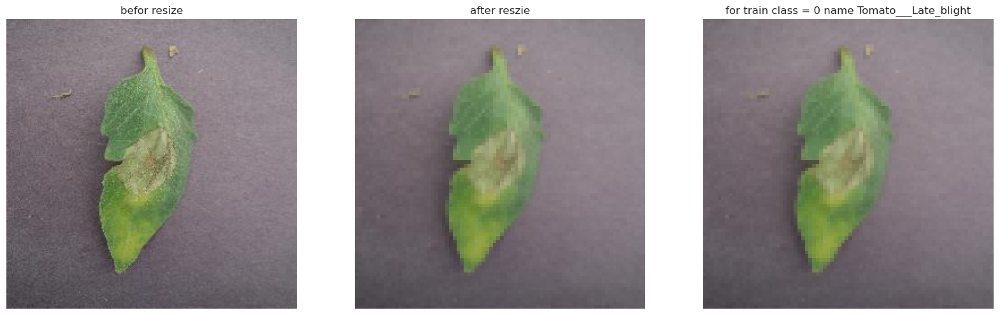

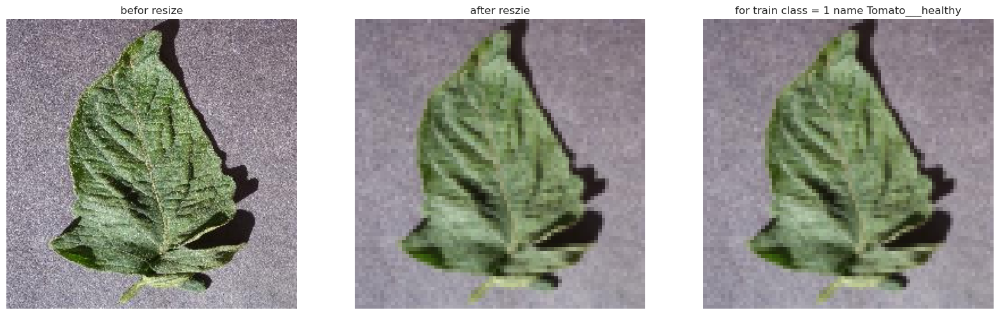

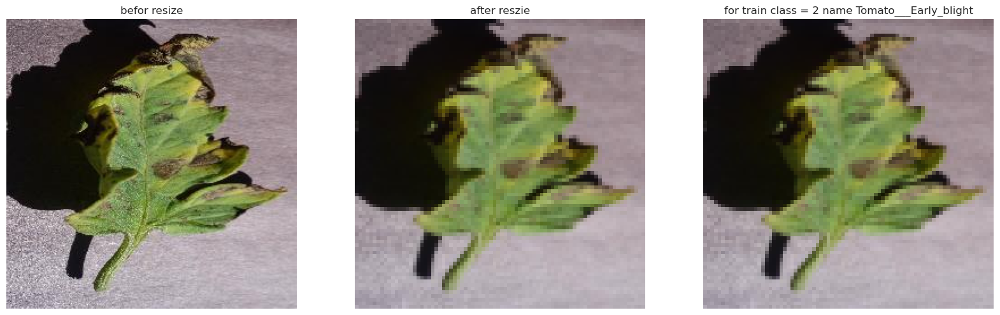

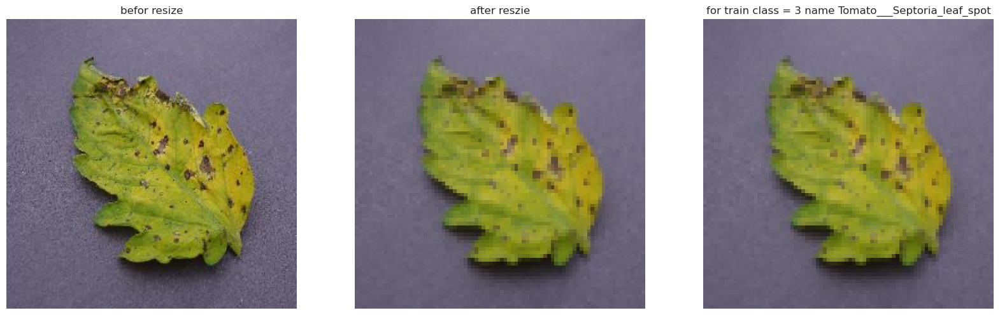

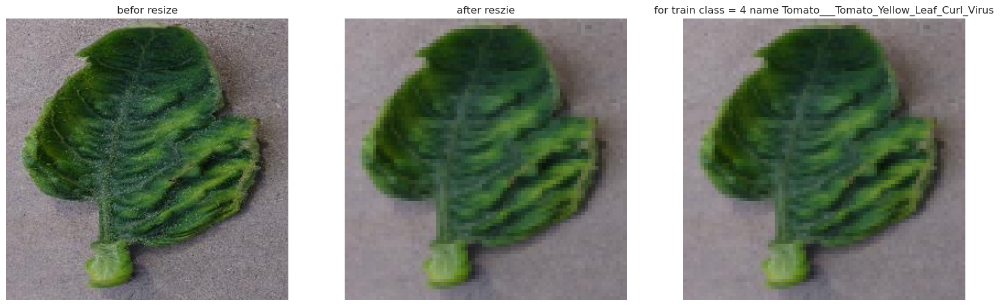

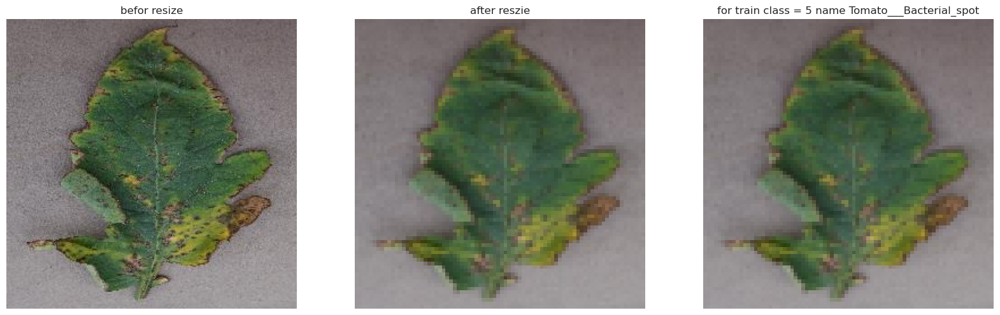

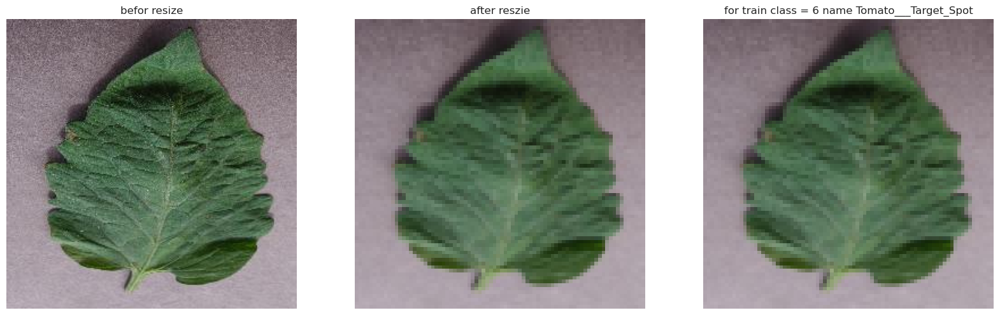

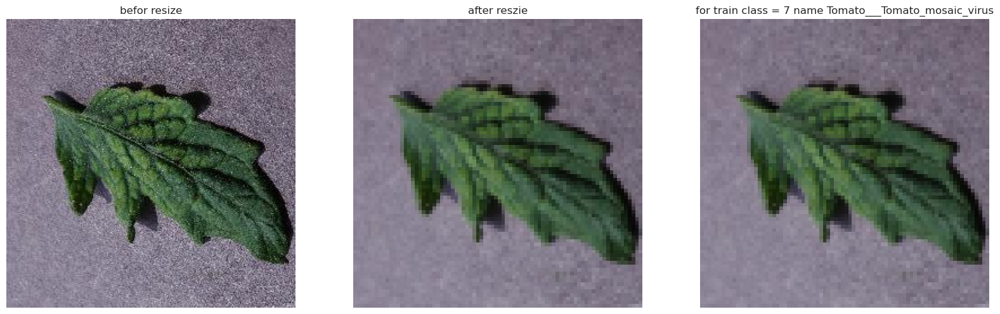

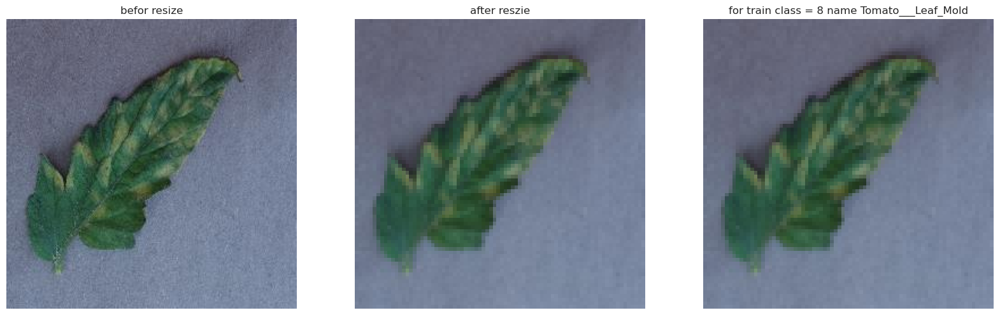

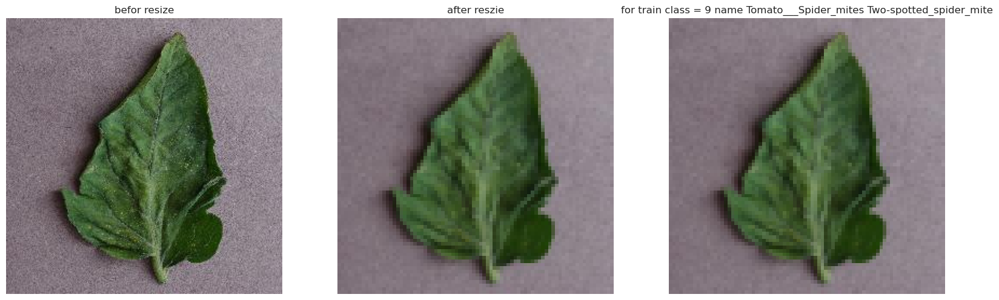

In [221]:
resize_image(train_path , "train")

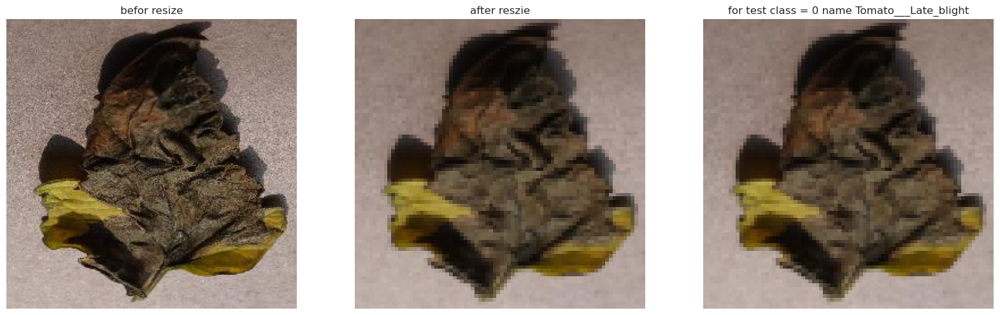

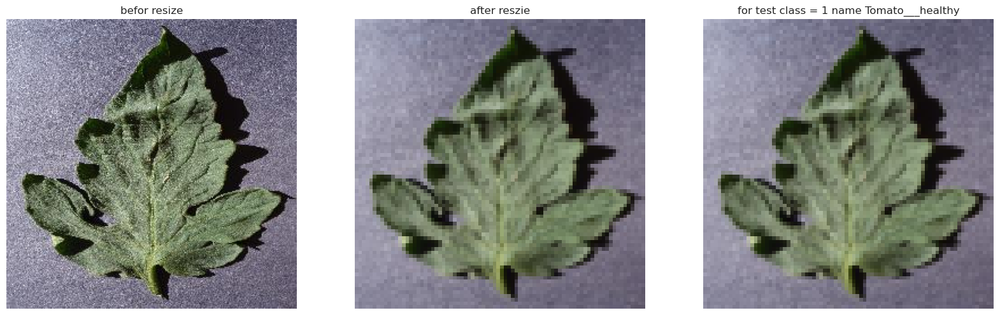

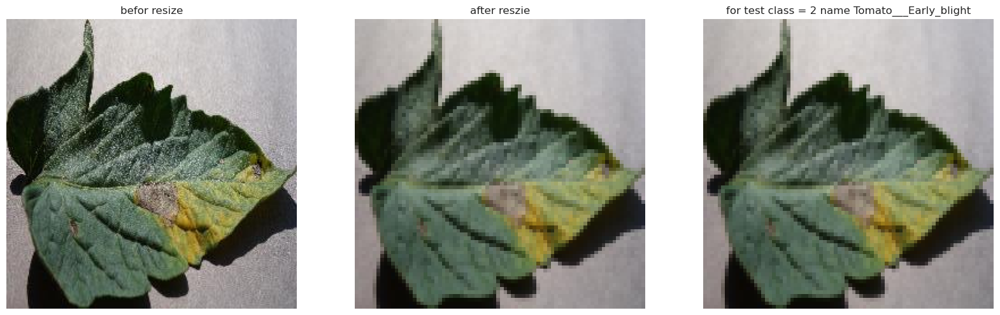

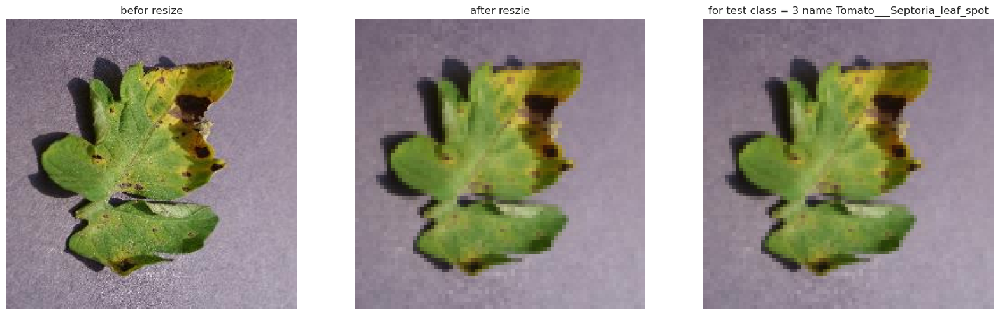

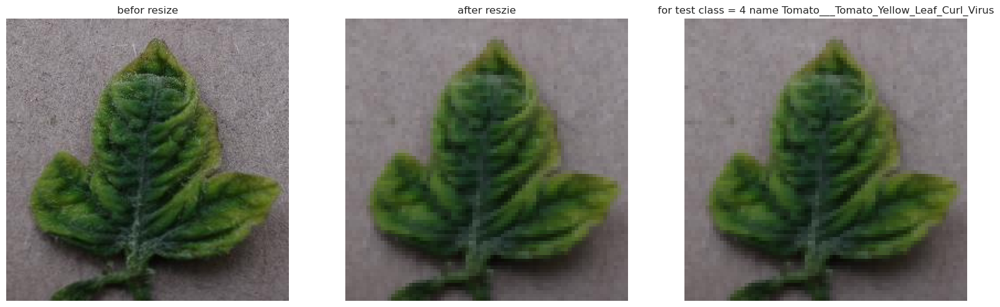

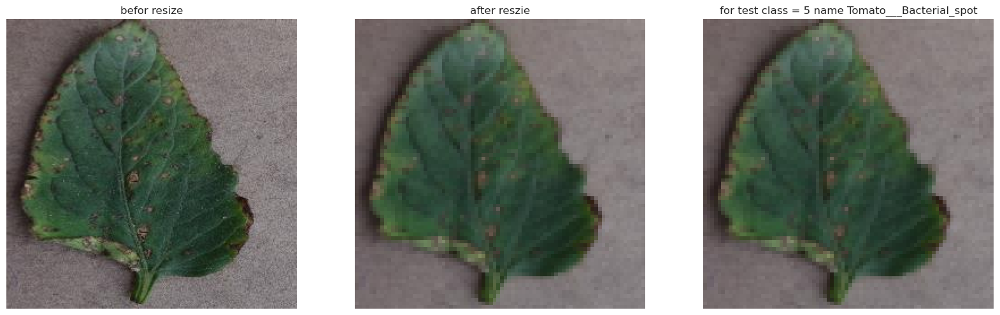

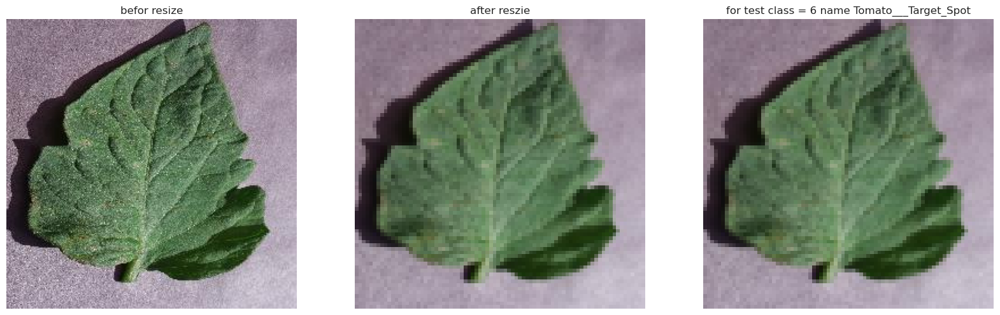

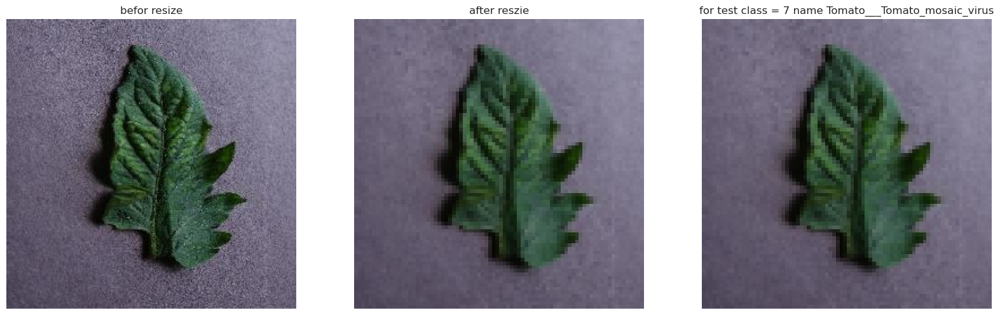

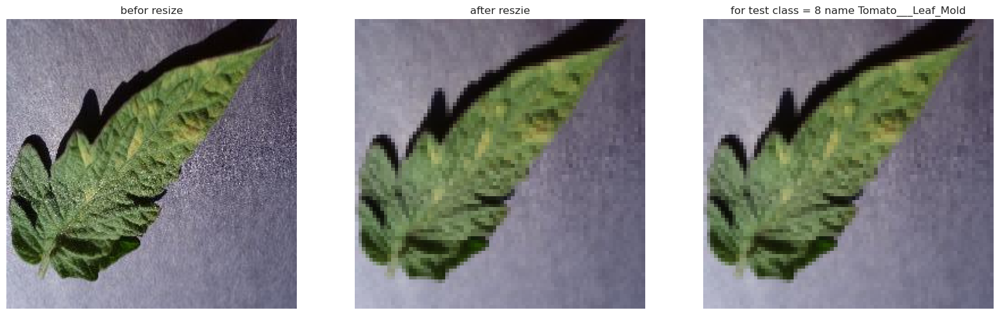

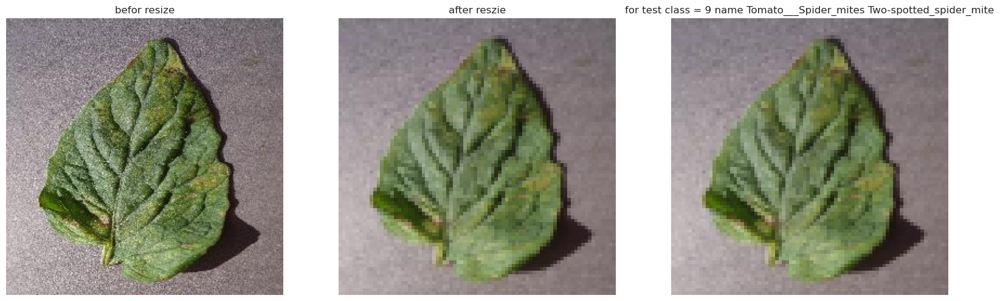

In [222]:
resize_image(test_path , "test")

In [223]:
X_train = train
X_test = test
del train
del test

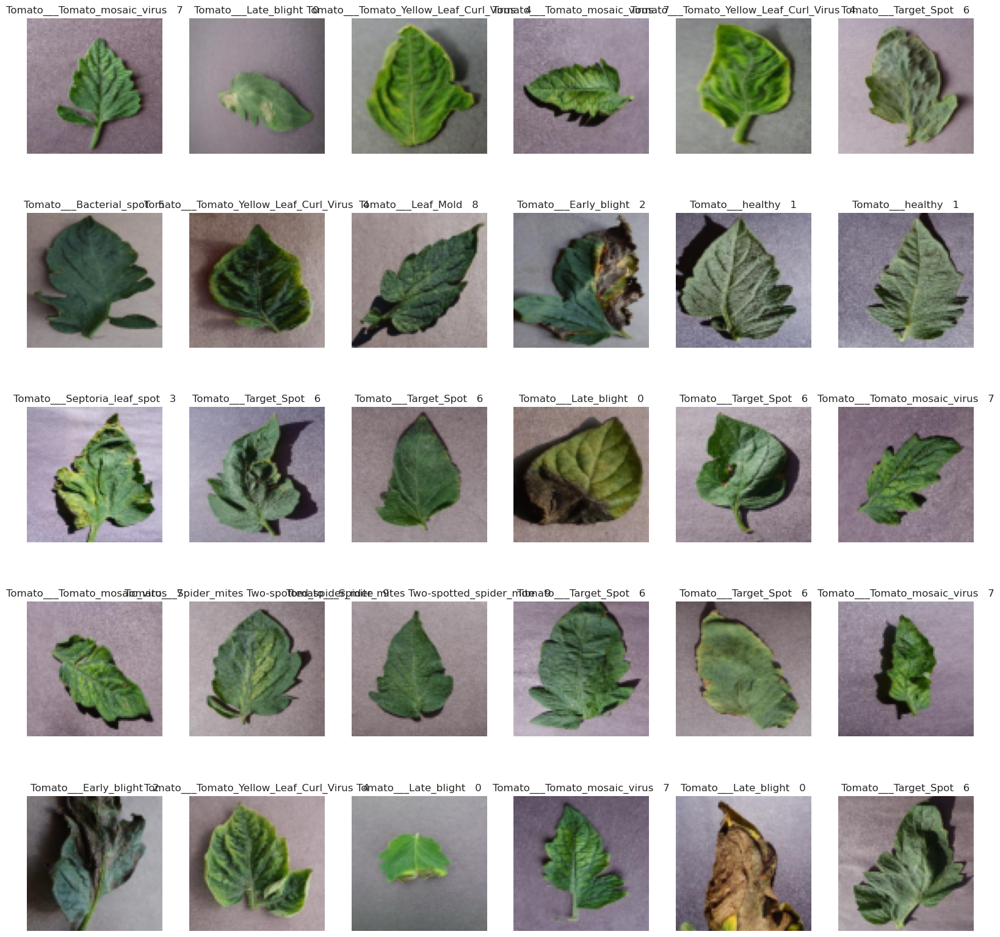

In [171]:
plt.figure(figsize=(20 , 20))
for i , n in enumerate(list(np.random.randint(0 , len(X_train) , 30))):
    plt.subplot(5 , 6 , i+1)
    plt.imshow(X_train[n])
    plt.title(f"{get_code(Y_train[n])}   { Y_train[n]}" )
    plt.axis("off")
plt.show()

In [ ]:
plt.figure(figsize=(20 , 20))
for i , n in enumerate(list(np.random.randint(0 , len(X_test) , 30))):
    plt.subplot(5 , 6 , i+1)
    plt.imshow(X_test[n])
    plt.title(f"{get_code(Y_test[n])}   { Code[get_code(Y_test[n])]}" )
    plt.axis("off")
plt.show()

In [224]:
X_train = np.array(X_train)
X_test = np.array(X_test)
Y_train = np.array(Y_train)
Y_test = np.array(Y_test)

print(f"X_train shape is : {X_train.shape}")
print(f"Y_train shape is : {Y_train.shape}")
print(f"X_test shape is : {X_test.shape}")
print(f"Y_test shape is : {Y_test.shape}")

X_train shape is : (10000, 80, 80, 3)
Y_train shape is : (10000,)
X_test shape is : (1000, 80, 80, 3)
Y_test shape is : (1000,)


In [230]:
""""
model = keras.models.Sequential([
    
    keras.layers.Conv2D(512 , kernel_size=(3,3) , activation = "relu" , input_shape=(80 , 80 ,3)),
    keras.layers.Conv2D(265 , kernel_size=(3 , 3) , activation = "relu"),
    
    keras.layers.MaxPool2D(pool_size=(3, 3)),
    keras.layers.Dropout(0.25),
    
    keras.layers.Conv2D(128 , kernel_size=(3 , 3) , activation = "relu"),
    keras.layers.Conv2D(64 , kernel_size=(3 , 3) , activation = "relu"),
    
    keras.layers.MaxPool2D(pool_size=(3, 3)),
    keras.layers.Dropout(0.25),
    
    keras.layers.Flatten(),
    keras.layers.Dense(130 ,activation='relu'),
    keras.layers.Dense(120 ,activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10 , activation="softmax"),
    
])

"""
model = keras.models.Sequential([
    
    keras.layers.Conv2D(128 , kernel_size=(3,3) , activation = "relu" , input_shape=(80 , 80 ,3)),
    
    
    keras.layers.MaxPool2D(pool_size=(3, 3)),
    keras.layers.Dropout(0.25),
    
    keras.layers.Conv2D(128 , kernel_size=(3 , 3) , activation = "relu"),
    
    
    
    keras.layers.Conv2D(128 , kernel_size=(3 , 3) , activation = "relu"),
    
    
    keras.layers.MaxPool2D(pool_size=(3, 3)),
    keras.layers.Dropout(0.5),
    
    keras.layers.Conv2D(128 , kernel_size=(3 , 3) , activation = "relu"),
    
    keras.layers.Flatten(),
    keras.layers.Dense(512 ,activation='relu'),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(512 ,activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10 , activation="softmax"),

    
])

In [241]:
model.compile(optimizer= "adam" , loss="sparse-categorical_crossentropy" ,
              metrics=["accuracy"])

In [228]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (None, 78, 78, 128)       3584      
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 26, 26, 128)      0         
 g2D)                                                            
                                                                 
 dropout_41 (Dropout)        (None, 26, 26, 128)       0         
                                                                 
 conv2d_53 (Conv2D)          (None, 24, 24, 128)       147584    
                                                                 
 conv2d_54 (Conv2D)          (None, 22, 22, 128)       147584    
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 7, 7, 128)        0         
 g2D)                           

In [232]:
history = model.fit(X_train , Y_train , validation_data=(X_test , Y_test), epochs= 15 , batch_size=64,verbose=1)

Epoch 1/15


2023-08-06 00:01:42.304983: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_14/dropout_45/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


157/157 [==============================] - 7s 25ms/step - loss: 2.1249 - accuracy: 0.2010 - val_loss: 1.7148 - val_accuracy: 0.3580
Epoch 2/15
157/157 [==============================] - 3s 22ms/step - loss: 1.4071 - accuracy: 0.5047 - val_loss: 1.1485 - val_accuracy: 0.6160
Epoch 3/15
157/157 [==============================] - 3s 22ms/step - loss: 0.9502 - accuracy: 0.6673 - val_loss: 0.8141 - val_accuracy: 0.7060
Epoch 4/15
157/157 [==============================] - 3s 21ms/step - loss: 0.7063 - accuracy: 0.7511 - val_loss: 0.5806 - val_accuracy: 0.7910
Epoch 5/15
157/157 [==============================] - 3s 21ms/step - loss: 0.5592 - accuracy: 0.8062 - val_loss: 0.5432 - val_accuracy: 0.8100
Epoch 6/15
157/157 [==============================] - 3s 22ms/step - loss: 0.4705 - accuracy: 0.8363 - val_loss: 0.4718 - val_accuracy: 0.8320
Epoch 7/15
157/157 [==============================] - 3s 21ms/step - loss: 0.3737 - accuracy: 0.8740 - val_loss: 0.4081 - val_accuracy: 0.8630
Epoch 8/15

In [233]:
ModelLoss, ModelAccuracy = model.evaluate(X_test , Y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

32/32 [==============================] - 0s 5ms/step - loss: 0.3593 - accuracy: 0.8920
Test Loss is 0.3592551350593567
Test Accuracy is 0.8920000195503235


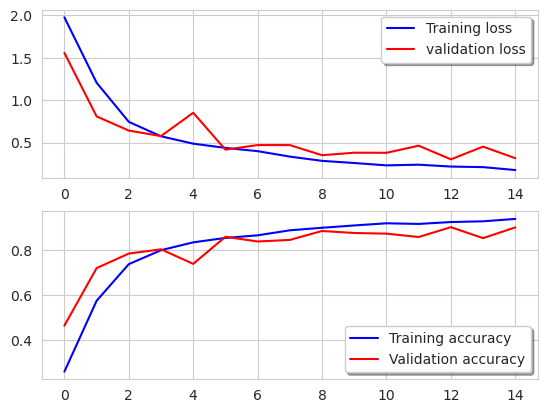

In [186]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [234]:
imag_path = "/kaggle/input/tomatoleaf/tomato/train/Tomato___healthy/003944fc-3b99-4a0f-9ed4-0e07352fd8b3___RS_HL 9844.JPG"
image = plt.imread(imag_path)
image = np.array(image)
img_array = np.expand_dims(image, axis=0)
img_preprocessed = img_array / 255.0
image = resize(img_preprocessed , (1 , 80 , 80 , 3))

In [167]:
image.shape

(1, 80, 80, 3)

In [240]:
pred = model.predict(image)
get_code(np.argmax(pred ))

1/1 [==============================] - 0s 19ms/step


'Tomato___Spider_mites Two-spotted_spider_mite'

In [169]:
def pred(path):
    image = plt.imread(path)
    image = resize(image , (1 , 80 , 80 , 3))
    image = np.array(image)
    
    return get_code(np.argmax(model.predict(image)))

1/1 [==============================] - 0s 19ms/step


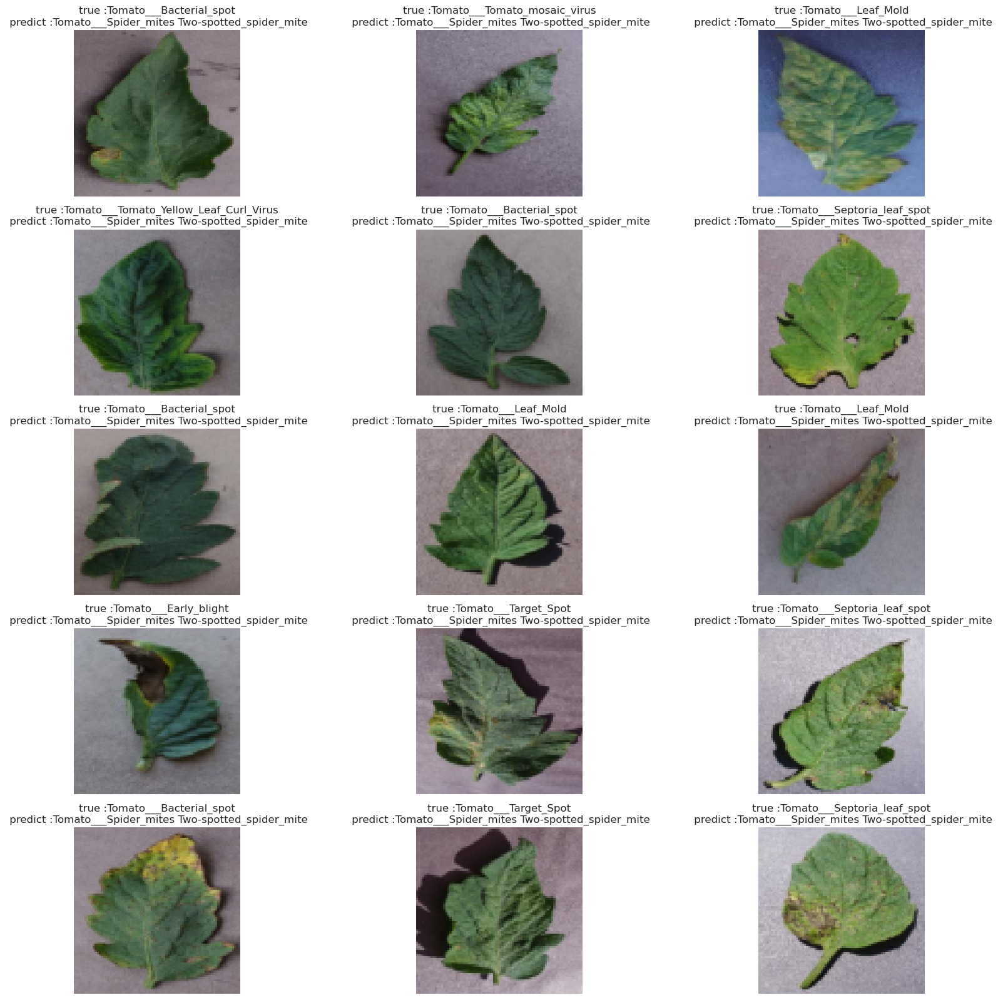

In [180]:
plt.figure(figsize=(20 , 20))
for i , n in enumerate(list(np.random.randint(0 , len(X_train) , 15))):
    plt.subplot(5 , 3 , i+1)
    plt.imshow(X_train[n])
    plt.title(f"true :{get_code(Y_train[n])}\n predict :{get_code(np.argmax(model.predict(resize(X_train[n] , (1 , 80 , 80 , 3)))))}")
    plt
    plt.axis("off")
plt.show()

###### 